In [76]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import numpy as np

import torch
from torch.utils.data import DataLoader
import torch.utils.data as data_utils
from torch.optim import SGD, Adam

import matplotlib.pyplot as plt

from datasets import get_dataset    
from loss_fns import get_loss
from utils import solve

torch.set_default_dtype(torch.float64)

%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [77]:
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = torch.device('cpu')

In [78]:
def logistic_reg(w, X, y):
    return torch.mean(torch.log(1 + torch.exp(-y * (X @ w))))

def nllsq(w, X, y):
    return torch.mean( ( y - (1/(1 + torch.exp(-X @ w ))) )**2 )

def rademacher_old(weights):
    return torch.round(torch.rand_like(weights)) * 2 - 1

def diag_estimate_old(weights, grad, iters):
    Ds = []
    for j in range(iters):
        z = rademacher_old(weights)
        with torch.no_grad():
            hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
        Ds.append((hvp*z))

    return torch.mean(torch.stack(Ds), 0)


def load_result(dataset, percent, scale, batch_size, epochs, loss_class, optimizer_class, lr, preconditioner, slack_method, lmd, mu, seed):
    
    results_dir = os.getenv("RESULTS_DIR")
    
    directory = f"{results_dir}/{dataset}/percent_{percent}/scale_{scale}/bs_{batch_size}" \
    f"/epochs_{epochs}/{loss_class}/{optimizer_class}/lr_{lr}/precond_{preconditioner}/slack_{slack_method}/lmd_{lmd}/mu_{mu}/seed_{seed}"

    if not os.path.isdir(directory):
        return None

    grad_norm_sq = []
    loss = []
    slack = []

    grad_norm_sq = torch.load(f"{directory}/grad_norm_sq")
    loss = torch.load(f"{directory}/loss")

    if slack_method != "none" and optimizer_class != "bsps2":
        slack = torch.load(f"{directory}/slack")
    else:
        slack = [0 for x in loss]

    return [[x, y, z] for x, y, z in zip(loss, grad_norm_sq, slack)]

def citardouq_solve(a, b, c):
    det = b * b - 4 * a * c
    if det < 1e-40:
        x1 = 0.0
        x2 = 0.0
    else:
        x1 = (2 * c) / (-b - np.sqrt(det))
        x2 = (2 * c) / (-b + np.sqrt(det))
    return np.asarray([x1, x2])

In [79]:
torch.random.manual_seed(0)

# parameters for D
alpha = 1e-4
beta=0.999
# parameters for slack
lmd = 0.01
mu = 0.1

# Setup
batch_size = 64
dataset_name = "a1a"
percentage = 1.0
uninterpolatible = False

# training 
EPOCHS = 200
loss_name = "logreg"
loss_class = get_loss(loss_name)

scale_k = 0
train_data, train_target = get_dataset(dataset_name, batch_size, percentage, scale_k)

X = train_data
Y = train_target
if uninterpolatible:
    X = torch.cat((train_data, train_data, train_data))
    Y = torch.cat((train_target, train_target, -train_target))
    
train_data = X.to(torch.get_default_dtype())
train_target = Y.to(torch.get_default_dtype())
train_load = data_utils.TensorDataset(train_data, train_target)
train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=True)

# sample = train_data.numpy()
# target = train_target.numpy()

# unq, count = np.unique(sample, axis=0, return_counts=True)
# unq[count > 1].shape

/home/farshed.abdukhakimov/projects/sps2/datasets


# CG

In [80]:
# d = 100
# A = np.random.randn(d,d)
# A = 0.5*(A+A.T)
# xopt = np.random.randn(d)
# b = A @ xopt 

# x = np.zeros_like(xopt)

# r = b - np.dot(A, x)
# p = np.copy(r)
# step = 0
# diff = np.linalg.norm(b - np.dot(A, x))
# hist = []
# while diff > 1e-8:
#     Ap = np.dot(A, p)
#     alpha_k = np.dot(r, r) / np.dot(p, Ap)
#     x = x + alpha_k * p
#     rold = r.copy()
#     r = r - alpha_k * Ap
#     beta_k = np.dot(r, r) / np.dot(rold, rold)
#     p = r + beta_k * p
#     diff = np.linalg.norm(b - np.dot(A, x))
#     hist.append(diff)
#     step += 1

#     if step == 1e4:
#         print("max iter reached")
#         break

# print(f"Took {step} steps to get ||b - Ax|| =  {diff} \n" 
#       f"||xopt - x|| = {np.linalg.norm(xopt - x)}")

In [81]:
def train_optimizer(optimizer, lr):
    # parameters
    w = torch.zeros(train_data.shape[1], device=device).requires_grad_()
    optimizer = optimizer([w], lr=lr)
    loss_function = loss_class(w)

    # save loss and grad size to history
    hist = []
    loss = loss_function(train_data.to(device), train_target.to(device))
    g, = torch.autograd.grad(loss, w, create_graph=True)
    print(f"Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")
    hist.append([loss.item(), (torch.linalg.norm(g) ** 2).item()])

    for step in range(EPOCHS):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            batch_data = batch_data.to(device)
            batch_target = batch_target.to(device)
            optimizer.zero_grad()
            loss = loss_function(batch_data, batch_target)
            loss.backward()
            optimizer.step()

        loss = loss_function(train_data.to(device), train_target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)
        print(f"Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")
        hist.append([loss.item(), (torch.linalg.norm(g) ** 2).item()])

    return hist

# SGD

In [82]:
sgd_lr = 0.01
hist_sgd = load_result(dataset_name, percentage, scale_k, batch_size, EPOCHS, loss_name, "sgd", sgd_lr, "none", "none", lmd, mu, 0)

if not hist_sgd:
    hist_sgd = train_optimizer(SGD, sgd_lr)

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243
Loss: 0.611222709754477 | GradNorm^2: 0.21468614981104286
Loss: 0.5694692411432862 | GradNorm^2: 0.11826657441135957
Loss: 0.5439682618813088 | GradNorm^2: 0.07101230425981493
Loss: 0.5277212482775934 | GradNorm^2: 0.04957522587254598
Loss: 0.5160865429704357 | GradNorm^2: 0.038409243105326424
Loss: 0.5065802283542968 | GradNorm^2: 0.0323842260264988
Loss: 0.4985015702885682 | GradNorm^2: 0.029075438803738123
Loss: 0.49124175234318235 | GradNorm^2: 0.026468081672614028
Loss: 0.48485727253377137 | GradNorm^2: 0.024323408514829236
Loss: 0.47852568830887426 | GradNorm^2: 0.022678573066565313
Loss: 0.4728329148196657 | GradNorm^2: 0.020936733374694583
Loss: 0.46760501036240676 | GradNorm^2: 0.01944803603203417
Loss: 0.4628777088512464 | GradNorm^2: 0.018231722081579336
Loss: 0.45830004509096944 | GradNorm^2: 0.01702040358688629
Loss: 0.4541009878419446 | GradNorm^2: 0.016011094305857725
Loss: 0.44995956498072187 | GradNorm^2: 0.014

# Adam

In [83]:
adam_lr = 0.01
hist_adam = load_result(dataset_name, percentage, scale_k, batch_size, EPOCHS, loss_name, "adam", sgd_lr, "none", "none", lmd, mu, 0)

if not hist_adam:
    hist_adam = train_optimizer(Adam, adam_lr)

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243
Loss: 0.43814055631409216 | GradNorm^2: 0.017401287647842812
Loss: 0.3816793082164798 | GradNorm^2: 0.007784703666123253
Loss: 0.35859270443606317 | GradNorm^2: 0.0019386394912369238
Loss: 0.34654663214673487 | GradNorm^2: 0.001068838100861987
Loss: 0.3387048473899358 | GradNorm^2: 0.0009085918390486597
Loss: 0.3335070664066834 | GradNorm^2: 0.0007990955082905461
Loss: 0.32991630603161387 | GradNorm^2: 0.0010925077344861225
Loss: 0.3258764022937208 | GradNorm^2: 0.00021778160357241986
Loss: 0.32439829036635953 | GradNorm^2: 0.0015288342217776069
Loss: 0.32180223894988474 | GradNorm^2: 0.00032954369550953187
Loss: 0.3200597530302197 | GradNorm^2: 0.0004161533277224121
Loss: 0.3184974526812935 | GradNorm^2: 0.00019388389340580168
Loss: 0.31714762337065305 | GradNorm^2: 0.0003226466137356929
Loss: 0.3158310571986457 | GradNorm^2: 0.00023816289792086387
Loss: 0.31497759942460557 | GradNorm^2: 0.0005470244263691137
Loss: 0.314132638

# PSPS2-L
$w_{t+1}, \; s_{t+1} = {\arg\min}_{w\in\mathbb{R}^d,s\geq0}\frac{1}{2}\|w-w_t\|_{D}^2+\mu(s-s_t)^2+\lambda s \nonumber \\
    \textit{s.t.} \quad f_i(w_t) +  \langle  \nabla  f_i(w_t), w-w_t\rangle +\frac{1}{2}\langle B(w-w^t), w - w^t \rangle \leq s \nonumber,$

In [103]:
def run_psps2_slack(update_precond="hutch", constr_precond="hutch", slack_method="L1"):

    w = torch.zeros(train_data.shape[1], device=device).requires_grad_()

    loss_function = loss_class(w)

    # slack
    s = torch.tensor(0.0)
    delta = mu + lmd

    # save loss and grad size to history
    hist = []
    loss = loss_function(train_data.to(device), train_target.to(device))
    g, = torch.autograd.grad(loss, w, create_graph=True)
    f_grad = g.clone().detach()
    print(f"Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()} | s: {s.item()}")
    hist.append([loss.item(), (torch.linalg.norm(g) ** 2).item(), s.item()])

    root_star = torch.tensor(0.0)

    # preconditioninig matrix
    if update_precond == "none":
        Dk = torch.ones_like(w)
        Dk_hat_inv = torch.ones_like(w)
    elif update_precond == "hutch":
        Dk = diag_estimate_old(w, g, 100)
    elif update_precond == "sr1":
        hgp = torch.zeros_like(w) # s = H_inv * grad
        r = f_grad - torch.autograd.grad(g, w, grad_outputs=hgp, retain_graph=True)[0]
        p = r.detach().clone()
        r_prev = torch.dot(r, r)
        MAX_ITER = 100

    if constr_precond == "hutch":
        Dk = diag_estimate_old(w, g, 100)
    elif constr_precond == "sr1":
        hgp = torch.zeros_like(w) # s = H_inv * grad
        r = f_grad - torch.autograd.grad(g, w, grad_outputs=hgp, retain_graph=True)[0]
        p = r.detach().clone()
        r_prev = torch.dot(r, r)
        MAX_ITER = 100

    for epoch in range(EPOCHS):

        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            batch_data = batch_data.to(device)
            batch_target = batch_target.to(device)

            loss = loss_function(batch_data, batch_target)
            g, = torch.autograd.grad(loss, w, create_graph=True)
            f_grad = g.clone().detach()

            s_nil = s - lmd/(2*mu)
            t = loss.item() - s_nil
        
            if update_precond == "hutch":

                vk = diag_estimate_old(w, g, 1)
                # Smoothing and Truncation 
                Dk = beta * Dk + (1 - beta) * vk
                Dk_hat = torch.abs(Dk)
                Dk_hat[Dk_hat < alpha] = alpha
                Dk_hat_inv = 1 / Dk_hat
                
                if constr_precond == "hutch":
                    gnorm = (g * Dk_hat_inv).dot(g)
                    
                    a = torch.dot(f_grad, Dk_hat_inv*f_grad).cpu().detach().numpy()

                    if slack_method == "L1":
                        AA = 1
                        BB = 2 + mu * a - 2 * mu * t
                        CC = 1 + 2 * mu * a - 4 * mu * t
                        DD = -2 * mu * t

                        roots = solve(AA, BB, CC, DD)
                        roots = torch.from_numpy(roots)      
                        root_star = torch.relu(torch.max(roots))

                        s = torch.relu(s - ((lmd - root_star)/2 * mu)).item()
                    elif slack_method == "L2":
                        AA = 1
                        BB = 2 + delta * a - 2 * delta * t
                        CC = 1 + 2 * delta * a - 4 * delta * t
                        DD = -2 * delta * t

                        roots = solve(AA, BB, CC, DD)
                        roots = torch.from_numpy(roots)      
                        root_star = torch.relu(torch.max(roots))

                        s = (1/delta) * (mu * s + (root_star/2)).item()

                    precond = root_star/(1 + root_star) * Dk_hat_inv    
                    with torch.no_grad():
                        w.sub_(precond  * f_grad)

                elif constr_precond == "sr1":

                    sk = f_grad.clone()
                    yk = torch.autograd.grad(g, w, grad_outputs=sk, retain_graph=True)[0]
        
                    D_inv = torch.diagflat(Dk_hat_inv.clone().detach())
                    D_inv_B = (((Dk_hat_inv * yk).reshape(-1, 1) @ yk.reshape(1, -1)) / (yk.dot(sk)))
                    D_inv_B_D_inv = D_inv_B * Dk_hat_inv

                    a = torch.dot(f_grad, Dk_hat_inv * f_grad)
                    a = a.cpu().detach().numpy()

                    b = torch.dot(f_grad, D_inv_B_D_inv@f_grad)
                    b = b.cpu().detach().numpy() 

                    c_torch = torch.trace(D_inv_B)
                    c = c_torch.cpu().detach().numpy()


                    if slack_method == "L1":
                        d = a + (1 / 2 * mu)
                    elif slack_method == "L2":
                        d = a + 1/(2 * delta)

                    # AA = 2 * d * c**2 - 2 * b * c
                    # BB = 4 * d * c - 3 * b - 2 * t * c**2
                    AA = 2 * c_torch * ((c/2*mu) + torch.dot(f_grad, (c_torch * D_inv - D_inv_B_D_inv) @ f_grad))
                    BB = ( 2 * c_torch * (1 - t * c * mu) / mu ) + torch.dot(f_grad, (4 * c_torch * D_inv - 3 * D_inv_B_D_inv) @ f_grad) 
                    CC = 2 * d - 4 * t * c
                    DD = -2 * t

                    BB = BB / AA
                    CC = CC / AA
                    DD = DD / AA
                    AA = torch.tensor(1.0)

                    lmds = solve(AA, BB, CC, DD)
                    lmds = torch.from_numpy(lmds).to(device)
                    lmd_max = torch.max(lmds)
                    lmd_min = torch.maximum(torch.min(lmds), torch.tensor(0))
                    lmd_star = lmd_max

                    if lmd_star > 1e6:
                        print(f"lmd_star is: {lmd_star}")
                        pass
                    else:
                        precond = lmd_star * ( D_inv - (lmd_star * (D_inv_B_D_inv) / (1 + lmd_star * c_torch)) )
                        if slack_method == "L1":
                            s = torch.maximum(torch.tensor(0.0), s - 1/(2*mu)*(lmd - lmd_star)).item()
                        elif slack_method == "L2":
                            s = (1/delta * (mu * s + lmd_star/2)).item()

                    with torch.no_grad():
                        w.sub_(precond  @ f_grad)


            elif update_precond == "sr1":

                if constr_precond == "hutch":
                    pass

                elif constr_precond == "sr1":
                    hgp = torch.zeros_like(w) # s = H_inv * grad
                    r = f_grad.clone()
                    p = r.detach().clone()

                    old_root_star = root_star

                    for cg_step in range(MAX_ITER):
                        hvp = torch.autograd.grad(g, w, grad_outputs=p, retain_graph=True)[0]
                        alpha_k = torch.dot(r, r) / torch.dot(p, hvp)
                        hgp = hgp + alpha_k * p
                        r_prev = r.clone()
                        r = r - alpha_k * hvp
                        if torch.norm(r) < 1e-10:
                            Ax = torch.autograd.grad(g, w, grad_outputs=hgp, retain_graph=True)[0]    
                            diff = torch.norm(Ax - f_grad)
                            print(f"Took {cg_step} to reach diff={diff}")
                            break

                        beta_k = torch.dot(r, r) / torch.dot(r_prev, r_prev)
                        p = r + beta_k * p

                    gnorm_sq = torch.dot(f_grad, hgp)
                    if slack_method == "L1":
                        AA = 1
                        BB = 2 + mu * gnorm_sq - 2 * mu * t
                        CC = 1 + 2 * mu * gnorm_sq - 4 * mu * t
                        DD = -2 * mu * t
                        
                        roots = solve(AA, BB, CC, DD)
                        roots = torch.from_numpy(roots)      
                        root_star = torch.relu(torch.max(roots))

                    elif slack_method == "L2":
                        AA = 1
                        BB = 2 + delta * gnorm_sq - 2 * delta * t
                        CC = 1 + 2 * delta * gnorm_sq - 4 * delta * t
                        DD = -2 * delta * t

                        roots = solve(AA, BB, CC, DD)
                        roots = torch.from_numpy(roots)      
                        root_star = torch.relu(torch.max(roots))

                    if root_star > 1e2:
                        print(f"lmd_star is: {root_star}")
                        continue
                
                    if slack_method == "L1":
                        s = torch.relu(s - ((lmd - root_star)/2 * mu)).item()
                    elif slack_method == "L2":
                        s = (1/delta) * (mu * s + (root_star/2)).item()
                    precond = root_star/(1 + root_star) * hgp
                        
                    with torch.no_grad():
                        print(root_star)
                        w.sub_(precond)

        loss = loss_function(train_data.to(device), train_target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)
        print(f"[{epoch+1}/{EPOCHS}] | Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()} | s: {s}")
        hist.append([loss.item(), (torch.linalg.norm(g) ** 2).item(), s])

    return hist

    
# %lprun -f run run()

In [104]:
hist_psps2_L1_BB = run_psps2_slack("sr1", "sr1", "L1")

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243 | s: 0.0
tensor(0.7146)
tensor(0.1291)
tensor(0.5971)
tensor(0.1200)
tensor(0.6893)
tensor(0.1115)
tensor(0.4277)
tensor(0.1265)
tensor(0.4125)
tensor(0.1180)
tensor(0.3484)
tensor(0.1146)
tensor(0.5753)
tensor(0.0955)
tensor(0.4308)
tensor(0.0978)
tensor(0.5896)
tensor(0.1123)
tensor(0.7475)
tensor(0.0662)
tensor(0.6314)
tensor(0.0004)
tensor(0.4321)
tensor(0.0091)
tensor(0.5143)
tensor(3.5375e-05)
tensor(0.5628)
tensor(1.1545e-05)
tensor(0.3555)
tensor(2.2779e-05)
tensor(0.6773)
tensor(2.0804e-05)
tensor(0.3809)
tensor(1.8114e-05)
tensor(0.3851)
tensor(2.3329e-05)
tensor(0.5398)
tensor(5.6922e-06)
tensor(0.9633)
tensor(0.)
tensor(0.9407)
tensor(0.)
tensor(0.8331)
tensor(0.)
tensor(0.7985)
tensor(0.)
tensor(0.6371)
lmd_star is: 93084.7568359375
tensor(0.7529)
tensor(0.)
tensor(1.5875)
tensor(0.)
[1/200] | Loss: 47.7294820227081 | GradNorm^2: 0.5794141298619218 | s: 0.04256313082428602
tensor(0.7665)
tensor(0.)
tensor(1.0174)
t

TypeError: expected np.ndarray (got NoneType)

In [105]:
hist_psps2_L1_DD = run_psps2_slack("hutch", "hutch", "L1")

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243 | s: 0.0
[1/200] | Loss: 0.3317721831902989 | GradNorm^2: 0.002284368171403627 | s: 0.07205016314657434
[2/200] | Loss: 0.31725071321317844 | GradNorm^2: 0.0010231321381580806 | s: 0.12373921957267793
[3/200] | Loss: 0.31222379053762306 | GradNorm^2: 0.00025422939249651676 | s: 0.1618290122381566
[4/200] | Loss: 0.3106677124631995 | GradNorm^2: 0.0014360624355607358 | s: 0.19092547741315838
[5/200] | Loss: 0.31407069335080623 | GradNorm^2: 0.0004657332953064289 | s: 0.21556974548296898
[6/200] | Loss: 0.3123646880688469 | GradNorm^2: 0.003620412413993882 | s: 0.23410437956130278
[7/200] | Loss: 0.32679320734040146 | GradNorm^2: 0.02448165275838389 | s: 0.24985094858543094
[8/200] | Loss: 0.3115015238120589 | GradNorm^2: 0.004306160785038244 | s: 0.26174759236366707
[9/200] | Loss: 0.31365310019992754 | GradNorm^2: 0.008485364592266802 | s: 0.2708672066112093
[10/200] | Loss: 0.3077010291361158 | GradNorm^2: 0.001470541002100756

In [106]:
hist_psps2_L1_DB = run_psps2_slack("hutch", "sr1", "L1")

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243 | s: 0.0
[1/200] | Loss: 0.4667737827508577 | GradNorm^2: 0.0795204324502885 | s: 0.4354102808767407
[2/200] | Loss: 0.3892750768475473 | GradNorm^2: 0.009321720214178675 | s: 0.4639857972307447
[3/200] | Loss: 0.3639041002479609 | GradNorm^2: 0.005322738546473977 | s: 0.3573457970169284
[4/200] | Loss: 0.3510260233092235 | GradNorm^2: 0.003540996318089072 | s: 0.4071732424771387
[5/200] | Loss: 0.34265268155667883 | GradNorm^2: 0.002193539425999087 | s: 0.3096924349631325
[6/200] | Loss: 0.3362146322957399 | GradNorm^2: 0.003947164303085283 | s: 0.43856690360253214
[7/200] | Loss: 0.33307174710284354 | GradNorm^2: 0.002749086595429902 | s: 0.3463885683221615
[8/200] | Loss: 0.32968539908482253 | GradNorm^2: 0.003732125307726613 | s: 0.3729071730272301
[9/200] | Loss: 0.3268337757986664 | GradNorm^2: 0.004733223110196018 | s: 0.43795829973020445
[10/200] | Loss: 0.32339512070433757 | GradNorm^2: 0.0014393052609395266 | s: 0.317

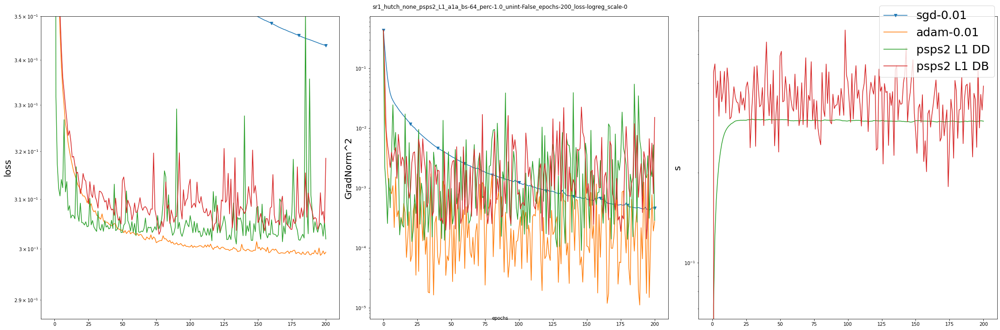

In [108]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))


ax1.semilogy([x[0] for x in hist_sgd], 'v-', markevery=len(hist_sgd)//10)
ax1.semilogy([x[0] for x in hist_adam])
ax1.semilogy([x[0] for x in hist_psps2_L1_DD])
ax1.semilogy([x[0] for x in hist_psps2_L1_DB])
# ax1.semilogy([x[0] for x in hist_bpsps2_l1_sr1])


ax2.semilogy([x[1] for x in hist_sgd], 'v-', markevery=len(hist_sgd)//10)
ax2.semilogy([x[1] for x in hist_adam])
ax2.semilogy([x[1] for x in hist_psps2_L1_DD])
ax2.semilogy([x[1] for x in hist_psps2_L1_DB])
# ax2.semilogy([x[1] for x in hist_bpsps2_l1_sr1])

ax3.semilogy([0 for x in hist_sgd])
ax3.semilogy([0 for x in hist_adam])
ax3.semilogy([x[2] for x in hist_psps2_L1_DD])
ax3.semilogy([x[2] for x in hist_psps2_L1_DB])
# ax3.semilogy([x[2] for x in hist_psps2_L1_sr1])

ax1.set_ylabel('loss', fontsize=20)
ax1.set_ylim(top=0.35)

ax2.set_ylabel('GradNorm^2', fontsize=20)
ax3.set_ylabel('s', fontsize=20)

fig.text(0.5, 0.04, 'epochs', ha='center', va='center', )

subtitle = f"sr1_hutch_none_psps2_L1_{dataset_name}_bs-{batch_size}_perc-{percentage}_unint-{uninterpolatible}_epochs-{EPOCHS}_loss-{loss_name}_scale-{scale_k}"

fig.suptitle(subtitle)
fig.legend([f'sgd-{sgd_lr}', f'adam-{adam_lr}', 'psps2 L1 DD', 'psps2 L1 DB'], prop={'size': 25})
plt.tight_layout()
fig.show()

# fig.savefig(f"temp_plots/{subtitle}.eps", 
#             dpi=200,
#             format="eps",
#             transparent=False
#             )

In [109]:
hist_psps2_L2_DD = run_psps2_slack("hutch", "hutch", "L2")

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243 | s: 0.0
[1/200] | Loss: 0.406295841547743 | GradNorm^2: 0.012222946093330802 | s: 0.387926052746505
[2/200] | Loss: 0.3776652621496486 | GradNorm^2: 0.007052159792889294 | s: 0.403639673763311
[3/200] | Loss: 0.36198631407535675 | GradNorm^2: 0.004676988449175749 | s: 0.3568742978261808
[4/200] | Loss: 0.35131893284739363 | GradNorm^2: 0.007434550183315617 | s: 0.3804483070685778
[5/200] | Loss: 0.34251507283385263 | GradNorm^2: 0.0024072555905622433 | s: 0.4146252652739438
[6/200] | Loss: 0.33872393918938026 | GradNorm^2: 0.003005154183620498 | s: 0.33626837007561583
[7/200] | Loss: 0.33324641751843936 | GradNorm^2: 0.0012395328888258259 | s: 0.35049408058341325
[8/200] | Loss: 0.32950462727818064 | GradNorm^2: 0.0021800738477244113 | s: 0.3791169181647446
[9/200] | Loss: 0.3260752966523819 | GradNorm^2: 0.0007325339429603387 | s: 0.3981972731224251
[10/200] | Loss: 0.3268950515910068 | GradNorm^2: 0.005836016522311178 | s: 0

In [110]:
hist_psps2_L2_DB = run_psps2_slack("hutch", "sr1", "L2")

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243 | s: 0.0
[1/200] | Loss: 0.4215224798980937 | GradNorm^2: 0.032039587737593335 | s: 0.4066800458485774
[2/200] | Loss: 0.3842760323207164 | GradNorm^2: 0.01142665114415096 | s: 0.3882851399101972
[3/200] | Loss: 0.3653904585780137 | GradNorm^2: 0.00623237743599157 | s: 0.4432679235367677
[4/200] | Loss: 0.3571267901016829 | GradNorm^2: 0.011051117951218036 | s: 0.3698955610611717
[5/200] | Loss: 0.34636113902994414 | GradNorm^2: 0.005164699189695819 | s: 0.36066456367089805
[6/200] | Loss: 0.3457936034932147 | GradNorm^2: 0.002190911680299377 | s: 0.09497139835505017
[7/200] | Loss: 0.3463214209772257 | GradNorm^2: 0.013888181743537708 | s: 0.3869826580129675
[8/200] | Loss: 0.336073201163505 | GradNorm^2: 0.0024609767480508393 | s: 0.4377110995262694
[9/200] | Loss: 0.3349196001676755 | GradNorm^2: 0.0026800603302168566 | s: 0.3009323718982477
[10/200] | Loss: 0.3335284724413503 | GradNorm^2: 0.006052130545485247 | s: 0.367417

In [111]:
hist_psps2_L2_BB = run_psps2_slack("sr1", "sr1", "L2")

Loss: 0.6931471805599453 | GradNorm^2: 0.43598460806863243 | s: 0.0
tensor(0.6605)
Took 99 to reach diff=9.372694903250656e-11
tensor(0.1399)
tensor(0.5489)
tensor(0.0136)
tensor(0.6543)
tensor(0.0120)
tensor(0.7478)
Took 99 to reach diff=8.541327129759578e-11
tensor(0.0082)
tensor(0.5399)
tensor(0.0130)
tensor(0.5228)
tensor(0.0076)
tensor(0.6828)
tensor(0.0043)
tensor(0.4917)
tensor(0.0193)
tensor(0.4911)
tensor(0.0221)
tensor(0.5520)
Took 79 to reach diff=4.3146688046417074e-11
tensor(0.0027)
tensor(0.6187)
tensor(0.0114)
tensor(0.5201)
Took 95 to reach diff=4.760466716937185e-12
tensor(0.0075)
tensor(0.6879)
Took 91 to reach diff=9.251390610978093e-11
tensor(0.0074)
tensor(0.5119)
tensor(0.0169)
tensor(0.5748)
Took 99 to reach diff=6.461312354462662e-11
tensor(0.0035)
tensor(0.4571)
Took 96 to reach diff=1.5107470477045525e-11
tensor(0.0093)
tensor(0.4337)
Took 97 to reach diff=6.77561284778956e-11
tensor(0.0198)
tensor(0.4427)
tensor(0.0035)
tensor(0.4758)
Took 98 to reach diff=6.

TypeError: expected np.ndarray (got NoneType)

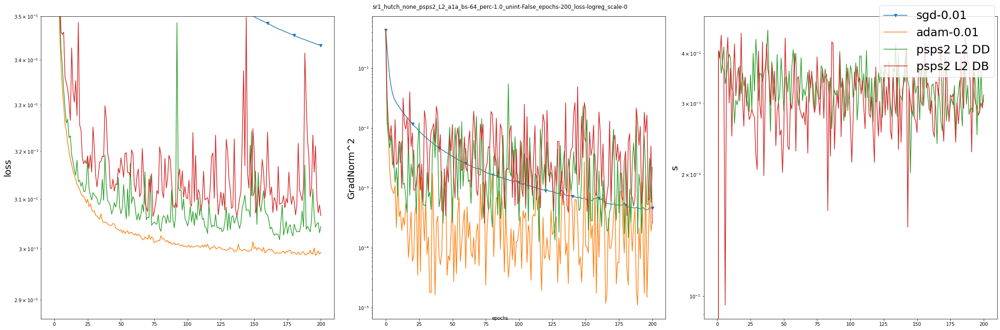

In [112]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))


ax1.semilogy([x[0] for x in hist_sgd], 'v-', markevery=len(hist_sgd)//10)
ax1.semilogy([x[0] for x in hist_adam])
ax1.semilogy([x[0] for x in hist_psps2_L2_DD])
ax1.semilogy([x[0] for x in hist_psps2_L2_DB])
# ax1.semilogy([x[0] for x in hist_bpsps2_l1_sr1])


ax2.semilogy([x[1] for x in hist_sgd], 'v-', markevery=len(hist_sgd)//10)
ax2.semilogy([x[1] for x in hist_adam])
ax2.semilogy([x[1] for x in hist_psps2_L2_DD])
ax2.semilogy([x[1] for x in hist_psps2_L2_DB])
# ax2.semilogy([x[1] for x in hist_bpsps2_l1_sr1])

ax3.semilogy([0 for x in hist_sgd])
ax3.semilogy([0 for x in hist_adam])
ax3.semilogy([x[2] for x in hist_psps2_L2_DD])
ax3.semilogy([x[2] for x in hist_psps2_L2_DB])
# ax3.semilogy([x[2] for x in hist_psps2_L1_sr1])

ax1.set_ylabel('loss', fontsize=20)
ax1.set_ylim(top=0.35)

ax2.set_ylabel('GradNorm^2', fontsize=20)
ax3.set_ylabel('s', fontsize=20)

fig.text(0.5, 0.04, 'epochs', ha='center', va='center', )

subtitle = f"sr1_hutch_none_psps2_L2_{dataset_name}_bs-{batch_size}_perc-{percentage}_unint-{uninterpolatible}_epochs-{EPOCHS}_loss-{loss_name}_scale-{scale_k}"

fig.suptitle(subtitle)
fig.legend([f'sgd-{sgd_lr}', f'adam-{adam_lr}', 'psps2 L2 DD', 'psps2 L2 DB'], prop={'size': 25})
plt.tight_layout()
fig.show()

# fig.savefig(f"temp_plots/{subtitle}.eps", 
#             dpi=200,
#             format="eps",
#             transparent=False
#             )

In [42]:
import torch
from torch.optim import Optimizer
from utils import Hutch

class PSPS2_B(Optimizer):

    def __init__(self, params, preconditioner="none", slack_method="none", s_method="sphere", lmd=0.01, mu=0.1):
        defaults = dict(s=0.0)
        self.lmd = lmd
        self.lmd_hat = 1.0 / (1.0 + self.lmd)
        self.s = 0.0
        self.z = 0.0
        self.mu = mu
        self.delta = lmd + mu
        
        if slack_method == "L1":
            self.update = self.update_L1
        elif slack_method == "L2":
            self.update = self.update_L2
        else:
            self.update = self.update_sps

        if s_method == "sphere":
            self.s_method = self.s_sphere
        elif s_method == "grad":
            self.s_method = self.s_grad
        elif s_method == "dgrad":
            self.s_method = self.s_dgrad

        self.preconditioner = None
        if preconditioner == "hutch":
            self.preconditioner = Hutch()
            
        self.preconditioner_initialized = False

        # TO-DO: Think of something better
        self.replay_buffer = []

        super().__init__(params, defaults)


    def step(self, closure=None):
        for group in self.param_groups:
            weights = list(group["params"])
            
            loss = closure()
            grad = torch.autograd.grad(loss, weights, create_graph=True)
            loss = loss.item()

            if self.preconditioner:
                if not self.preconditioner_initialized:
                    self.preconditioner.init(self, grad, 100)
                    self.preconditioner_initialized = True
                self.preconditioner.step(self, grad, 1)
            else:
                self.init_empty_precond()
                self.preconditioner_initialized = True

            gnorm_square = self.calc_grad_norm(grad).item()
            
            # if gnorm_square < 1e-13:
            #     continue 

            self.init_B(grad)

            try:
                self.update(grad, loss)
            except TypeError:
                pass

            self.replay_buffer.append({
                "loss": loss,
                "grad_norm_sq": gnorm_square,
                "slack": self.s,
                "z": self.z # z = s - s_nil
            }) 
                          
        return loss


    @torch.no_grad()
    def s_sphere(self, **kwargs):
        shape = kwargs["shape"]
        s = torch.randn(shape)
        s.div_(s.norm())
        return s

    @torch.no_grad()
    def s_grad(self, **kwargs):
        grad = kwargs["grad"]
        return grad

    @torch.no_grad()
    def s_dgrad(self, **kwargs):
        p = kwargs["param"]
        grad = kwargs["grad"]
        return self.state[p]['DkhatInv'] * grad


    @torch.no_grad()
    def init_B(self, grad):
        for group in self.param_groups:
            for p, g in zip(group["params"], grad):
                # sk = self.s_sphere(p.shape[0]).to(p.device)
                
                sk = self.s_method(shape=p.shape[0], grad=g, param=p).to(p.device)

                yk = self.state[p]['DkhatInv'] * sk
                yk2 = torch.square(self.state[p]['DkhatInv']) * sk

                self.state[p]["D_inv_mx"] =  torch.diagflat(self.state[p]['DkhatInv'].clone().detach())
                self.state[p]["D_inv_B"] = ((yk2.reshape(-1, 1) @ yk.reshape(1, -1)) / (yk.dot(sk)))
                self.state[p]['D_inv_B_D_inv'] = self.state[p]["D_inv_B"] * self.state[p]['DkhatInv']


    @torch.no_grad()
    def update_sps(self, grad, loss):

        for group in self.param_groups: 
            for p, g in zip(group['params'], grad):

                Dk_hat_inv = self.state[p]['DkhatInv']
                D_inv_B_D_inv = self.state[p]['D_inv_B_D_inv']
                D_inv_B = self.state[p]["D_inv_B"]
                D_inv = self.state[p]["D_inv_mx"]

                a = torch.dot(g, Dk_hat_inv*g)
                a = a.cpu().detach().numpy()

                b = torch.dot(g, D_inv_B_D_inv@g)
                b = b.cpu().detach().numpy() 

                c_torch = torch.trace(D_inv_B)
                c = c_torch.cpu().detach().numpy()

                AA = 2 * a * c ** 2
                BB = 4 * a * c - 2 * loss * c**2 - b * c
                CC = 2 * a - 4 * c * loss - 2 * b
                DD = - 2 * loss

                BB = BB / AA
                CC = CC / AA
                DD = DD / AA

                AA = torch.tensor(1.0)


                lmds = solve(AA, BB, CC, DD)
                lmds = torch.from_numpy(lmds).to(p.device)
                lmd_max = torch.max(lmds)
                lmd_min = torch.maximum(torch.min(lmds), torch.tensor(0))
                lmd_star = lmd_max

                if self.lagr(lmd_max, p, loss, g) < self.lagr(lmd_min, p, loss, g):
                    lmd_star = lmd_min

                precond = lmd_star * ( D_inv - (lmd_star * (D_inv_B_D_inv) / (1 + lmd_star * c_torch)) )

                p.sub_(precond @ g)
    

    @torch.no_grad()
    def update_L1(self, grad, loss):

            for group in self.param_groups:
                for p, g in zip(group['params'], grad):

                    Dk_hat_inv = self.state[p]['DkhatInv']
                    D_inv_B_D_inv = self.state[p]['D_inv_B_D_inv']
                    D_inv_B = self.state[p]["D_inv_B"]
                    D_inv = self.state[p]["D_inv_mx"]

                    s_nil = self.s - self.lmd/(2 * self.mu)
                    t = loss - s_nil

                    a = torch.dot(g, Dk_hat_inv * g)
                    a = a.cpu().detach().numpy()

                    b = torch.dot(g, D_inv_B_D_inv@g)
                    b = b.cpu().detach().numpy() 

                    c_torch = torch.trace(D_inv_B)
                    c = c_torch.cpu().detach().numpy()

                    d = 1 + 2 * self.mu * a

                    AA = d * c**2
                    BB = 2 * c * d - 2 * self.mu * t * c**2 - b * c * self.mu
                    CC = d - 4 * self.mu * t * c - 2 * b * self.mu
                    DD = -2 * self.mu * t

                    BB = BB / AA
                    CC = CC / AA
                    DD = DD / AA
                    AA = torch.tensor(1.0)

                    lmds = solve(AA, BB, CC, DD)
                    lmds = torch.from_numpy(lmds).to(p.device)
                        
                    lmd_max = torch.max(lmds)
                    lmd_star = torch.maximum(lmd_max, torch.tensor(0.0))
                    lmd_min = torch.maximum(torch.min(lmds), torch.tensor(0.0))
                    lmd_star = lmd_max
                    
                    if self.lagr(lmd_max, p, loss, g) < self.lagr(lmd_min, p, loss, g):
                        lmd_star = lmd_min
            
                    self.s = torch.maximum(torch.tensor(0.0), self.s - 1/(2*self.mu)*(self.lmd - lmd_star)).item()

                    precond = lmd_star * ( D_inv - (lmd_star * (D_inv_B_D_inv) / (1 + lmd_star * c_torch)) )

                    p.sub_(precond @ g)

    @torch.no_grad()
    def update_L2(self, grad ,loss):
        
        for group in self.param_groups: 
            for p, g in zip(group['params'], grad):

                Dk_hat_inv = self.state[p]['DkhatInv']
                D_inv_B_D_inv = self.state[p]['D_inv_B_D_inv']
                D_inv_B = self.state[p]["D_inv_B"]
                D_inv = self.state[p]["D_inv_mx"]

                
                s_nil = self.s - self.lmd/(2*self.mu)
                t = loss - s_nil

                a = torch.dot(g, Dk_hat_inv*g)
                a = a.cpu().detach().numpy()

                b = torch.dot(g, D_inv_B_D_inv@g)
                b = b.cpu().detach().numpy() 

                c_torch = torch.trace(D_inv_B)
                c = c_torch.cpu().detach().numpy()

                d = a + 1/(2 * self.delta) 

                AA = 2 * d * c**2
                BB = 4 * c * d - 2 * t * c**2 - b * c
                CC = 2 * d - 4 * t * c - 2 * b
                DD = -2 * t

                BB = BB / AA
                CC = CC / AA
                DD = DD / AA

                AA = torch.tensor(1.0)

                lmds = solve(AA, BB, CC, DD)
                lmds = torch.from_numpy(lmds).to(p.device)

                lmd_max = torch.max(lmds)
                lmd_star = torch.maximum(lmd_max, torch.tensor(0.0))
                lmd_min = torch.maximum(torch.min(lmds), torch.tensor(0.0))
                lmd_star = lmd_max
                
                if self.lagr(lmd_max, p, loss, g) < self.lagr(lmd_min, p, loss, g):
                    lmd_star = lmd_min

                self.s = (1/self.delta * (self.mu * self.s + lmd_star/2)).item()

                precond = lmd_star * ( D_inv - (lmd_star * (D_inv_B_D_inv) / (1 + lmd_star * c_torch)) )

                p.sub_(precond @ g)
            

    def init_empty_precond(self):
        for group in self.param_groups:
            for p in group['params']:
                self.state[p]['Dk'] = torch.ones_like(p) 
                self.state[p]['DkhatInv'] = torch.ones_like(p)

    def calc_grad_norm(self, grad):
        for group in self.param_groups: 
            gnorm_square = 0.
            for p, g in zip(group['params'], grad):
                g_detached = g.detach().clone()
                self.state[p]['scaled_grad'] = self.state[p]['DkhatInv'].mul(g_detached)
                gnorm_sq = self.state[p]['scaled_grad'].mul(g_detached).sum()
                gnorm_square += gnorm_sq

        return gnorm_square


    @torch.no_grad()
    def lagr(self, lmd, param, loss, grad):
        D_inv = self.state[param]["D_inv_mx"]
        D_inv_B_D_inv = self.state[param]["D_inv_B_D_inv"]
        c = torch.trace(self.state[param]["D_inv_B"])
        b = lambda l: D_inv - (l * (D_inv_B_D_inv) / (1 + l * c)) 
        return lmd * loss -  (1/2)*lmd**2 * torch.dot(grad, b(lmd)@grad)

In [43]:
def train(dataset_name, percentage, batch_size, scale, steps, loss_name, optimizer_class, **optimizer_kwargs):

    seed = 0

    torch.random.manual_seed(seed)

    loss_class = get_loss(loss_name)

    scale_range = [-scale, scale] # [-value, value]
    train_data, train_target = get_dataset(dataset_name, batch_size, percentage, scale_range, loss_class.y_range)
    train_data = train_data.to(torch.get_default_dtype())
    train_target = train_target.to(torch.get_default_dtype())
    train_load = data_utils.TensorDataset(train_data, train_target)
    train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=True)
    
    params = torch.zeros(train_data.shape[1], device=device).requires_grad_()

    train_load = data_utils.TensorDataset(train_data, train_target)
    train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=True)

    criterion = loss_class(params)
    optimizer = optimizer_class([params], **optimizer_kwargs)

    train_loss = criterion(train_data.to(device), train_target.to(device))
    g, = torch.autograd.grad(train_loss, params)
    grad_norm_sq = torch.linalg.norm(g).item() ** 2
    slack = 0

    hist = [[train_loss.item(), grad_norm_sq, slack]]
   
    for step in range(steps):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):  
            batch_data = batch_data.to(device)
            batch_target = batch_target.to(device)

            optimizer.zero_grad()
            
            def closure():
                return criterion(batch_data, batch_target)
            
            loss = closure()

            if isinstance(optimizer, PSPS2_B):     
                optimizer.step(closure) 
                slack = optimizer.replay_buffer[-1]["slack"]
            else:
                loss.backward()
                optimizer.step()

        train_loss = criterion(train_data.to(device), train_target.to(device))
        g, = torch.autograd.grad(train_loss, params)
        grad_norm_sq = torch.linalg.norm(g).item() ** 2

        hist.append([train_loss.item(), grad_norm_sq, slack])
    
        print(f"Loss: {train_loss.item()} | GradNorm^2: {grad_norm_sq} | s: {slack}")

    return hist


def plot_results(results, label):


    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 6), dpi=200)

    colors = ['blue', 'orange', 'green']

    for result, c in zip(results, colors):

        ax1.semilogy([x[0] for x in result], color=c)
        ax2.semilogy([x[1] for x in result], color=c)
        ax3.semilogy([x[2] for x in result], color=c)


    ax1.set_ylabel('loss', fontsize=20)
    ax2.set_ylabel('GradNorm^2', fontsize=20)
    ax3.set_ylabel('s', fontsize=20)

    fig.text(0.5, 0.04, 'epochs', ha='center', va='center', )
    fig.suptitle(label)
    fig.legend(['sphere', 'grad', 'dgrad'])
    plt.tight_layout()
    fig.show()

    # fig.savefig(f"../plots/pspsb2_{dataset_name}_logreg_scale:{scale_range}.png")

In [44]:
dataset_name = "colon-cancer"
percentage = 1.0
batch_size = 8
scale = 0

results_dict = {}

for loss_name in ("logreg", "nllsq"):
    for precond in ("none", "hutch"):
        for slack_method in ("none", "L1", "L2"):
            results = []
            for s_method in ["sphere", "grad", "dgrad"]:
                print(precond, slack_method, s_method)
                result = train(
                        dataset_name=dataset_name,
                        percentage=percentage,
                        batch_size=batch_size,
                        scale=scale,
                        steps=200,
                        loss_name=loss_name,
                        optimizer_class=PSPS2_B,
                        preconditioner=precond,
                        slack_method=slack_method,
                        s_method=s_method,
                    ) 

                results.append(result)
            results_dict.update({f"Dataset: {dataset_name} Loss: {loss_name} | BSPS2-{precond}-{slack_method}": results})

none none sphere
/home/farshed.abdukhakimov/projects/sps2/datasets
Loss: 0.31291504262246533 | GradNorm^2: 4.215002024536083 | s: 0.0
Loss: 0.2000181572027705 | GradNorm^2: 1.2164411457412903 | s: 0.0
Loss: 0.15816307771205906 | GradNorm^2: 1.3646109473555021 | s: 0.0
Loss: 0.11518363973142202 | GradNorm^2: 0.9659419970702451 | s: 0.0
Loss: 0.07961189983018836 | GradNorm^2: 0.3151908492885685 | s: 0.0
Loss: 0.06059794881624493 | GradNorm^2: 0.15254615468766186 | s: 0.0
Loss: 0.045372618564385334 | GradNorm^2: 0.04940976775241281 | s: 0.0
Loss: 0.03816186813719821 | GradNorm^2: 0.05824302817859401 | s: 0.0
Loss: 0.03539061165179305 | GradNorm^2: 0.1291866541296547 | s: 0.0
Loss: 0.03548365021692796 | GradNorm^2: 0.22218250580586554 | s: 0.0
Loss: 0.0223433279225598 | GradNorm^2: 0.03486913614338642 | s: 0.0
Loss: 0.019103976282798675 | GradNorm^2: 0.04824543005783655 | s: 0.0
Loss: 0.019869375950396645 | GradNorm^2: 0.11113190930196255 | s: 0.0
Loss: 0.021833337548478163 | GradNorm^2: 0

/tmp/ipykernel_1129241/1954097194.py:82: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout()


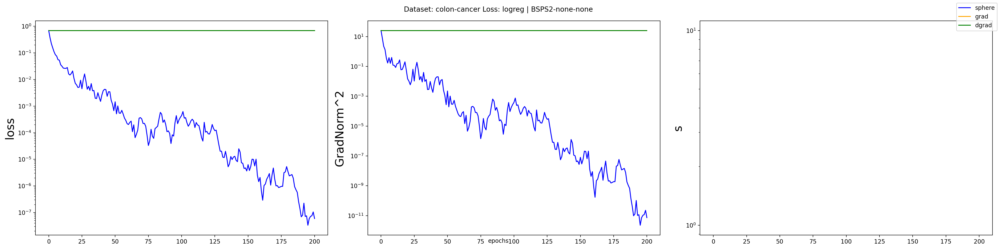

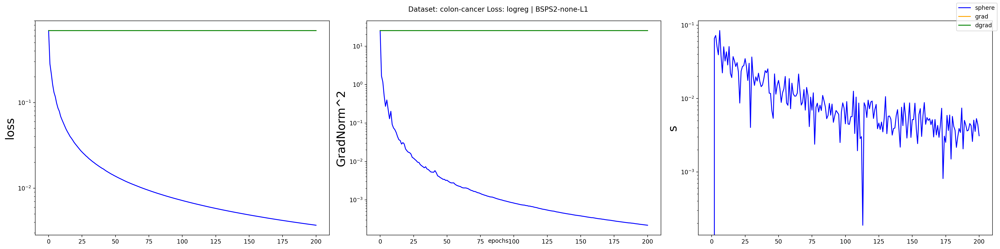

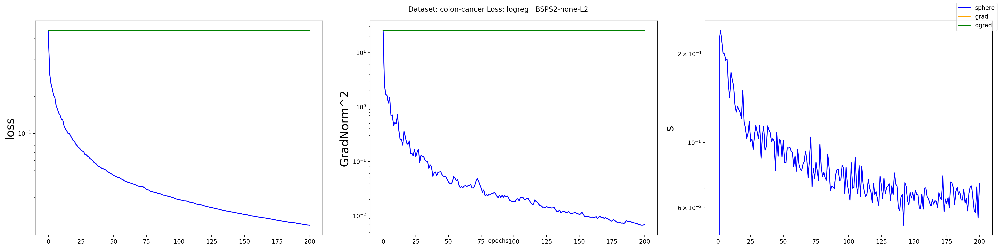

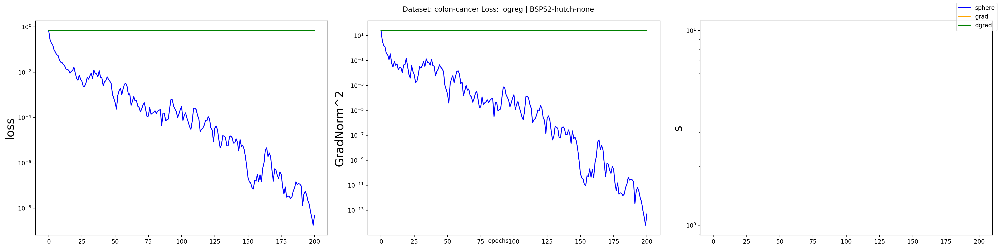

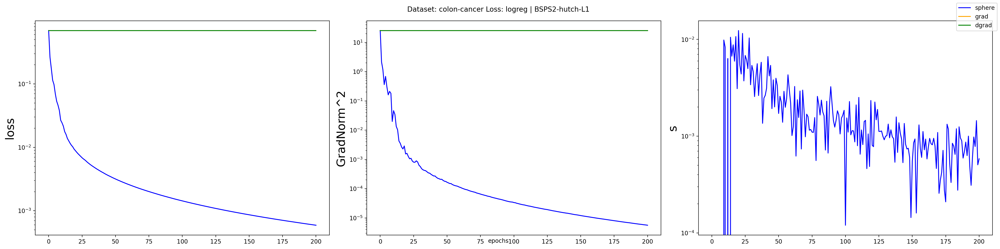

...

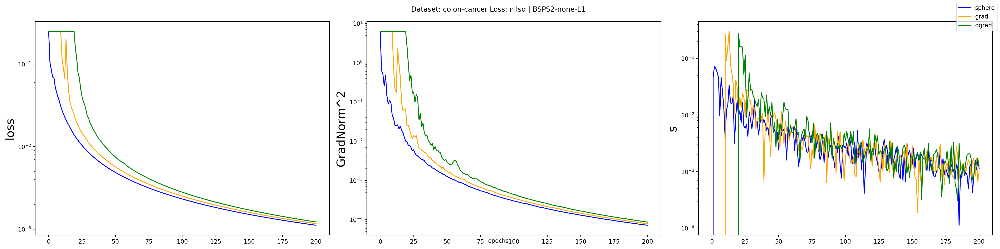

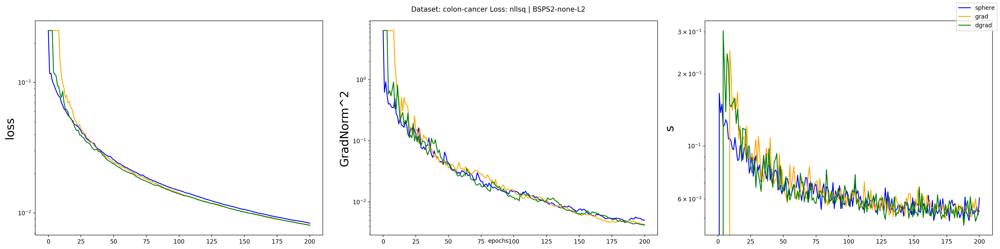

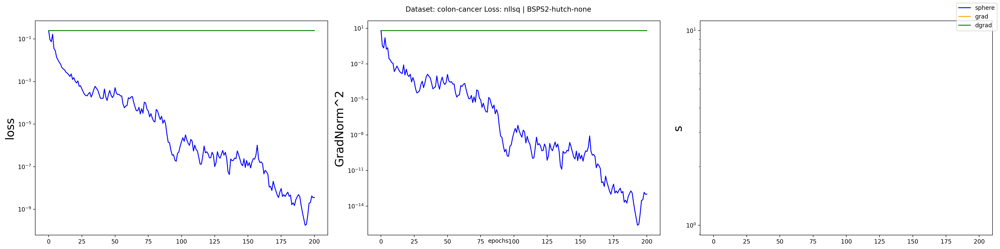

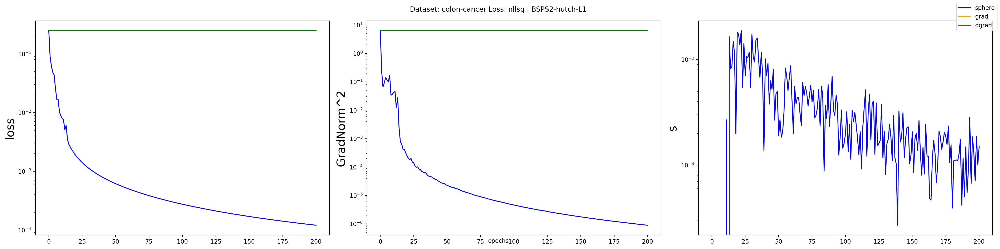

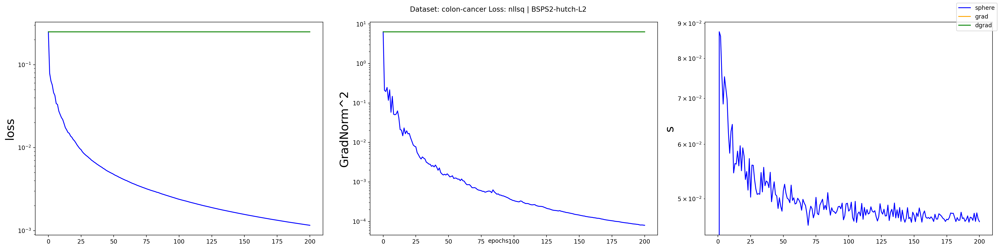

In [40]:
for loss_name in ("logreg", "nllsq"):
    for precond in ("none", "hutch"):
        for slack_method in ("none", "L1", "L2"):
            result_key = f"Dataset: {dataset_name} Loss: {loss_name} | BSPS2-{precond}-{slack_method}"
            plot_results(results_dict[result_key], result_key)

In [45]:
dataset_name = "mushrooms"
percentage = 1.0
batch_size = 64
scale = 0

mushrooms_results_dict = {}

for loss_name in ("logreg", "nllsq"):
    for precond in ("none", "hutch"):
        for slack_method in ("none", "L1", "L2"):
            results = []
            for s_method in ["sphere", "grad", "dgrad"]:
                print(precond, slack_method, s_method)
                result = train(
                        dataset_name=dataset_name,
                        percentage=percentage,
                        batch_size=batch_size,
                        scale=scale,
                        steps=200,
                        loss_name=loss_name,
                        optimizer_class=PSPS2_B,
                        preconditioner=precond,
                        slack_method=slack_method,
                        s_method=s_method,
                    ) 

                results.append(result)
            mushrooms_results_dict.update({f"Dataset: {dataset_name} Loss: {loss_name} | BSPS2-{precond}-{slack_method}": results})

none none sphere
/home/farshed.abdukhakimov/projects/sps2/datasets
Loss: 0.0049724875552167895 | GradNorm^2: 6.762759378624615e-06 | s: 0.0
Loss: 0.003475898381906797 | GradNorm^2: 3.198491439869893e-05 | s: 0.0
Loss: 0.002107653421792284 | GradNorm^2: 1.5663686242331805e-05 | s: 0.0
Loss: 0.001740471189171817 | GradNorm^2: 1.2028741631148379e-05 | s: 0.0
Loss: 0.0007098712634103298 | GradNorm^2: 3.928240362127466e-06 | s: 0.0
Loss: 0.0012591372775542112 | GradNorm^2: 7.487421832366189e-06 | s: 0.0
Loss: 0.0015726104515722697 | GradNorm^2: 9.082719064513086e-06 | s: 0.0
Loss: 0.0013629183782021854 | GradNorm^2: 6.954838791680166e-06 | s: 0.0
Loss: 0.0013195714488179473 | GradNorm^2: 6.6389759642950715e-06 | s: 0.0
Loss: 0.00102097719605751 | GradNorm^2: 4.522646761731449e-06 | s: 0.0
Loss: 0.0005254160862878194 | GradNorm^2: 1.9173305717892423e-06 | s: 0.0
Loss: 0.0018537904941493737 | GradNorm^2: 8.648056652209417e-06 | s: 0.0
Loss: 0.0007901270682422355 | GradNorm^2: 2.80408212600625

/tmp/ipykernel_1129241/1954097194.py:82: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout()


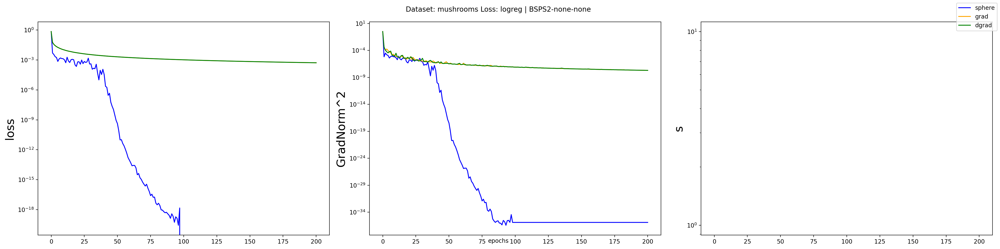

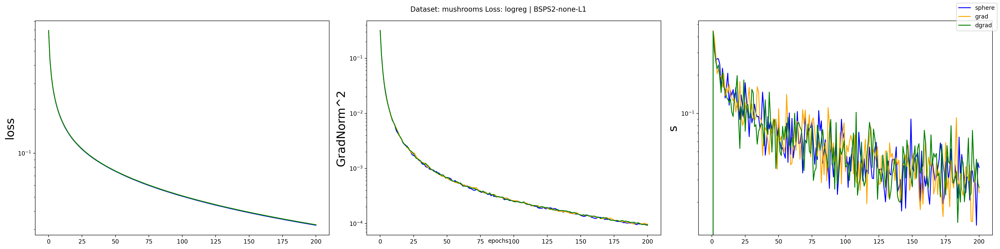

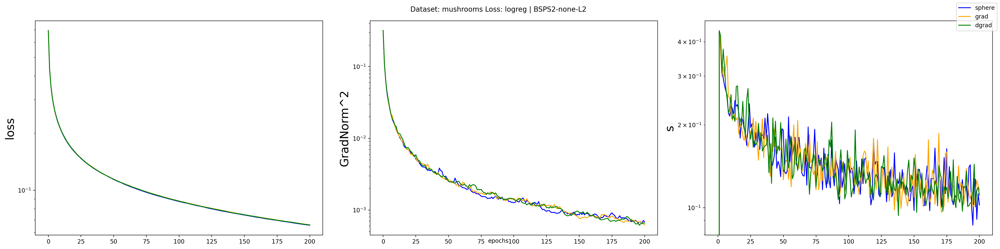

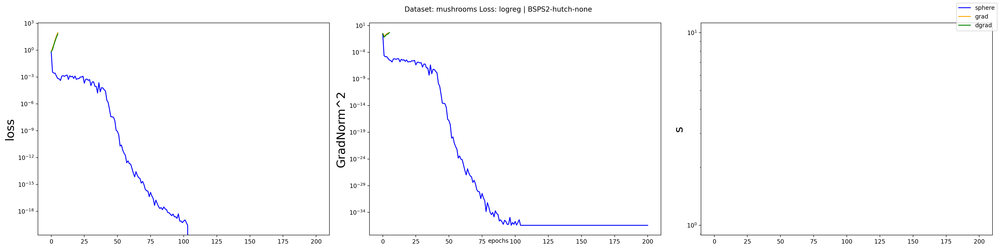

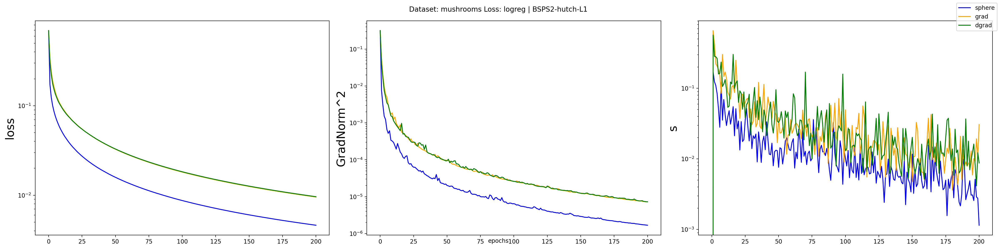

...

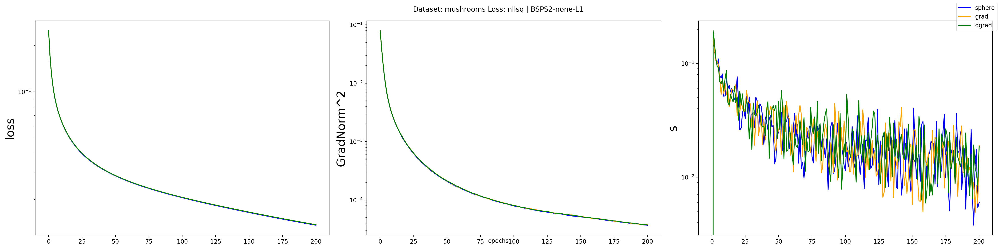

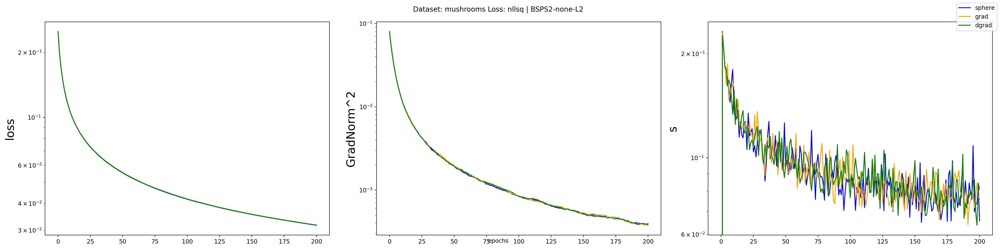

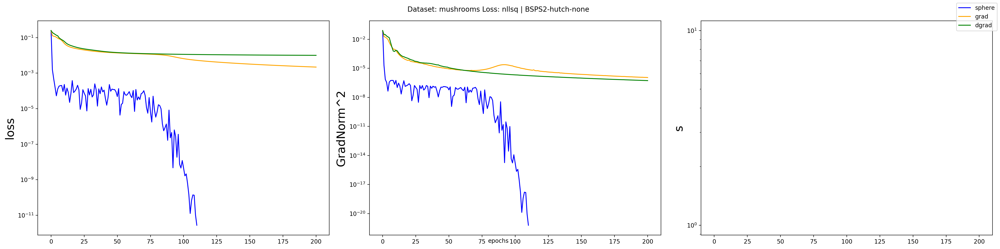

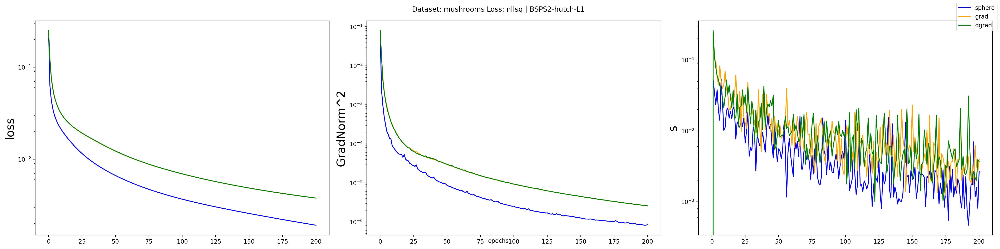

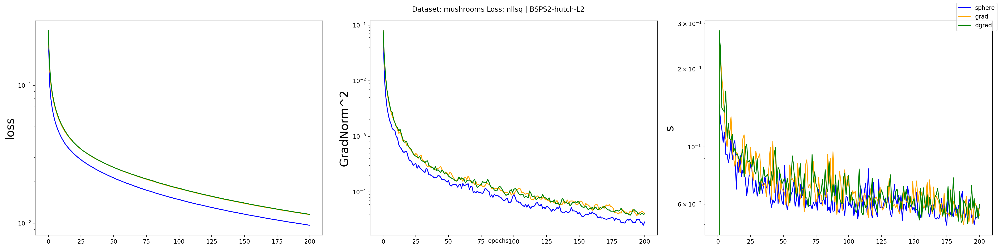

In [46]:
for loss_name in ("logreg", "nllsq"):
    for precond in ("none", "hutch"):
        for slack_method in ("none", "L1", "L2"):
            result_key = f"Dataset: {dataset_name} Loss: {loss_name} | BSPS2-{precond}-{slack_method}"
            plot_results(mushrooms_results_dict[result_key], result_key)

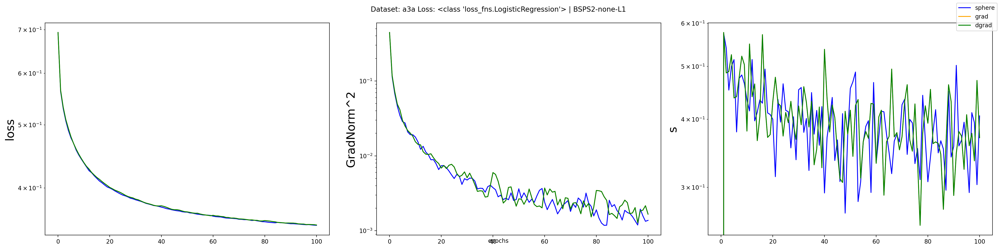

In [51]:
plot_results(results, "BSPS2-none-L1")

In [56]:
results = []
for s_method in ["sphere", "grad", "dgrad"]:
    print(s_method)
    result = train(
            seed=0,
            criterion_class=loss_class,
            train_data=train_data, 
            train_target=train_target, 
            batch_size=batch_size,
            steps=STEPS,
            optimizer_class=BSPS2,
            tb=False,
            preconditioner="none",
            slack_method="L2",
            s_method=s_method,
            lmd=lmd,
            mu=mu
        ) 

    results.append(result)

sphere
Loss: 0.5550243242716681 | GradNorm^2: 0.10013697002367074 | s: 0.5635084964432429 | z: 0.0
Loss: 0.5235637393378069 | GradNorm^2: 0.06136150411937454 | s: 0.5326326426457328 | z: 0.0
Loss: 0.5021913931091844 | GradNorm^2: 0.043299287238066156 | s: 0.45287789646923404 | z: 0.0
Loss: 0.48623726252744054 | GradNorm^2: 0.03290297503139573 | s: 0.4948353788294529 | z: 0.0
Loss: 0.47445659501220955 | GradNorm^2: 0.027901953922462096 | s: 0.5144607068691612 | z: 0.0
Loss: 0.46616036667903604 | GradNorm^2: 0.027343007271275862 | s: 0.39727916551238174 | z: 0.0
Loss: 0.4560598705319738 | GradNorm^2: 0.020971203216314942 | s: 0.47912031143371175 | z: 0.0
Loss: 0.44889888355861474 | GradNorm^2: 0.019531980178150977 | s: 0.49445923930095603 | z: 0.0
Loss: 0.44305327976487174 | GradNorm^2: 0.019945307818940987 | s: 0.47520218003943254 | z: 0.0
Loss: 0.4374638722630918 | GradNorm^2: 0.018655550890773705 | s: 0.45195349873826046 | z: 0.0
Loss: 0.4320604086105021 | GradNorm^2: 0.01636751578814

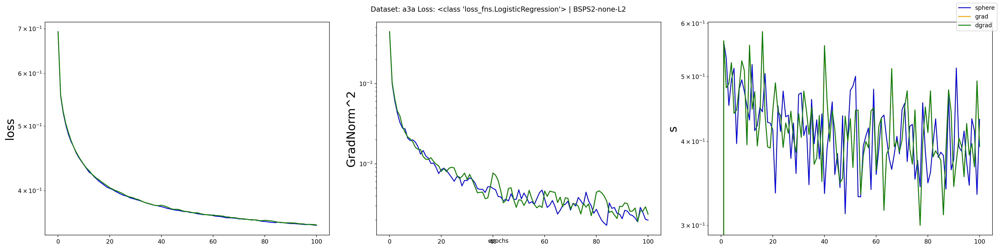

In [57]:
plot_results(results, "BSPS2-none-L2")

In [58]:
results = []
for s_method in ["sphere", "grad", "dgrad"]:
    print(s_method)
    result = train(
            seed=0,
            criterion_class=loss_class,
            train_data=train_data, 
            train_target=train_target, 
            batch_size=batch_size,
            steps=300,
            optimizer_class=BSPS2,
            tb=False,
            preconditioner="none",
            slack_method="none",
            s_method=s_method,
            lmd=lmd,
            mu=mu
        ) 

    results.append(result)

sphere
Loss: 0.4292780499405079 | GradNorm^2: 0.03490588779992975 | s: 0.0 | z: 0.0
Loss: 0.5827111573545348 | GradNorm^2: 0.17314001097731468 | s: 0.0 | z: 0.0
Loss: 0.39819725996955313 | GradNorm^2: 0.01943738418762069 | s: 0.0 | z: 0.0
Loss: 0.43605183171566453 | GradNorm^2: 0.052773857918098785 | s: 0.0 | z: 0.0
Loss: 0.40448037162942346 | GradNorm^2: 0.05704913745060182 | s: 0.0 | z: 0.0
Loss: 0.4724996849619716 | GradNorm^2: 0.14071388060745688 | s: 0.0 | z: 0.0
Loss: 0.7432557056006812 | GradNorm^2: 0.4342140214960731 | s: 0.0 | z: 0.0
Loss: 0.8910938009506782 | GradNorm^2: 0.5207098411492238 | s: 0.0 | z: 0.0
Loss: 0.6601514326677144 | GradNorm^2: 0.19095194266433127 | s: 0.0 | z: 0.0
Loss: 0.45866551257292415 | GradNorm^2: 0.10455188974959728 | s: 0.0 | z: 0.0
Loss: 0.37997575266054845 | GradNorm^2: 0.033500534999129555 | s: 0.0 | z: 0.0
Loss: 0.4274449496692323 | GradNorm^2: 0.03174609057400228 | s: 0.0 | z: 0.0
Loss: 0.4491421962653053 | GradNorm^2: 0.09117730904583048 | s: 

/tmp/ipykernel_2409141/1597145457.py:73: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout()


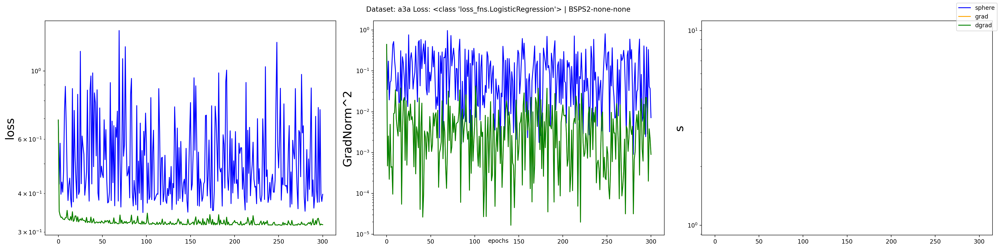

In [59]:
plot_results(results, "BSPS2-none-none")

In [60]:
results = []
for s_method in ["sphere", "grad", "dgrad"]:
    print(s_method)
    result = train(
            seed=0,
            criterion_class=loss_class,
            train_data=train_data, 
            train_target=train_target, 
            batch_size=batch_size,
            steps=300,
            optimizer_class=BSPS2,
            tb=False,
            preconditioner="Hutch",
            slack_method="L1",
            s_method=s_method,
            lmd=lmd,
            mu=mu
        ) 

    results.append(result)

sphere
Loss: 0.5627176316248466 | GradNorm^2: 0.11381145476119213 | s: 0.574990630334351 | z: 0.0
Loss: 0.5298426476313919 | GradNorm^2: 0.06799167828562167 | s: 0.5403680780626761 | z: 0.0
Loss: 0.5072925393665902 | GradNorm^2: 0.0464094228942104 | s: 0.4525557744303269 | z: 0.0
Loss: 0.4903116590455485 | GradNorm^2: 0.03462091742239239 | s: 0.5000357640395399 | z: 0.0
Loss: 0.4775671598933412 | GradNorm^2: 0.028628687804920238 | s: 0.5147249560254235 | z: 0.0
Loss: 0.46853021746660956 | GradNorm^2: 0.027474435768977516 | s: 0.37921312380327016 | z: 0.0
Loss: 0.45758325103881126 | GradNorm^2: 0.020916730739279583 | s: 0.4756287797303816 | z: 0.0
Loss: 0.4497181002076363 | GradNorm^2: 0.01918937338178253 | s: 0.48240948509234727 | z: 0.0
Loss: 0.4431274478123152 | GradNorm^2: 0.019127144480743447 | s: 0.4654112763741362 | z: 0.0
Loss: 0.4370662861412094 | GradNorm^2: 0.0177996327698195 | s: 0.43465231848215174 | z: 0.0
Loss: 0.43112109631994094 | GradNorm^2: 0.015350930420688358 | s: 0

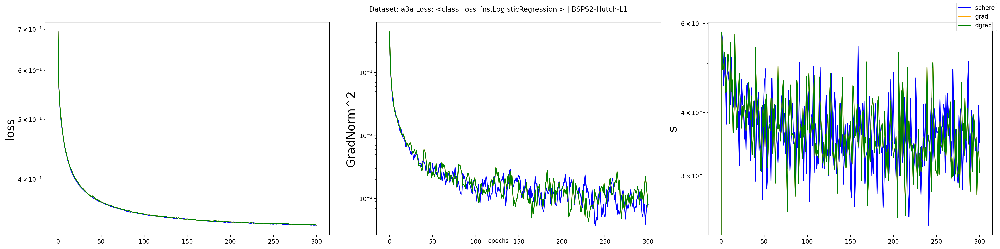

In [61]:
plot_results(results, "BSPS2-Hutch-L1")

In [62]:
results = []
for s_method in ["sphere", "grad", "dgrad"]:
    print(s_method)
    result = train(
            seed=0,
            criterion_class=loss_class,
            train_data=train_data, 
            train_target=train_target, 
            batch_size=batch_size,
            steps=300,
            optimizer_class=BSPS2,
            tb=False,
            preconditioner="Hutch",
            slack_method="L2",
            s_method=s_method,
            lmd=lmd,
            mu=mu
        ) 

    results.append(result)

sphere
Loss: 0.5550243242716681 | GradNorm^2: 0.10013697002367074 | s: 0.5635084964432429 | z: 0.0
Loss: 0.5235637393378069 | GradNorm^2: 0.06136150411937454 | s: 0.5326326426457328 | z: 0.0
Loss: 0.5021913931091844 | GradNorm^2: 0.043299287238066156 | s: 0.45287789646923404 | z: 0.0
Loss: 0.48623726252744054 | GradNorm^2: 0.03290297503139573 | s: 0.4948353788294529 | z: 0.0
Loss: 0.47445659501220955 | GradNorm^2: 0.027901953922462096 | s: 0.5144607068691612 | z: 0.0
Loss: 0.46616036667903604 | GradNorm^2: 0.027343007271275862 | s: 0.39727916551238174 | z: 0.0
Loss: 0.4560598705319738 | GradNorm^2: 0.020971203216314942 | s: 0.47912031143371175 | z: 0.0
Loss: 0.44889888355861474 | GradNorm^2: 0.019531980178150977 | s: 0.49445923930095603 | z: 0.0
Loss: 0.44305327976487174 | GradNorm^2: 0.019945307818940987 | s: 0.47520218003943254 | z: 0.0
Loss: 0.4374638722630918 | GradNorm^2: 0.018655550890773705 | s: 0.45195349873826046 | z: 0.0
Loss: 0.4320604086105021 | GradNorm^2: 0.01636751578814

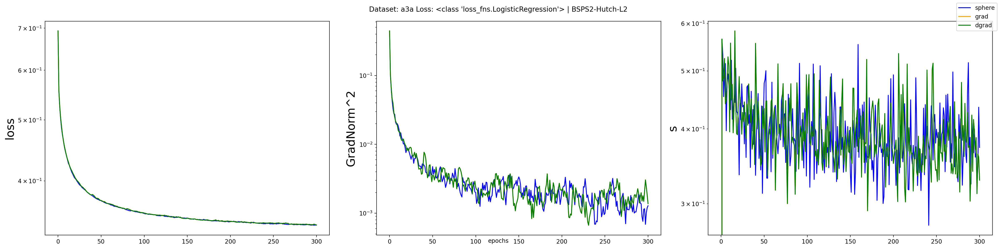

In [63]:
plot_results(results, "BSPS2-Hutch-L2")

In [64]:
results = []
for s_method in ["sphere", "grad", "dgrad"]:
    print(s_method)
    result = train(
            seed=0,
            criterion_class=loss_class,
            train_data=train_data, 
            train_target=train_target, 
            batch_size=batch_size,
            steps=300,
            optimizer_class=BSPS2,
            tb=False,
            preconditioner="Hutch",
            slack_method="none",
            s_method=s_method,
            lmd=lmd,
            mu=mu
        ) 

    results.append(result)

sphere
Loss: 0.4292780499405079 | GradNorm^2: 0.03490588779992975 | s: 0.0 | z: 0.0
Loss: 0.5827111573545348 | GradNorm^2: 0.17314001097731468 | s: 0.0 | z: 0.0
Loss: 0.39819725996955313 | GradNorm^2: 0.01943738418762069 | s: 0.0 | z: 0.0
Loss: 0.43605183171566453 | GradNorm^2: 0.052773857918098785 | s: 0.0 | z: 0.0
Loss: 0.40448037162942346 | GradNorm^2: 0.05704913745060182 | s: 0.0 | z: 0.0
Loss: 0.4724996849619716 | GradNorm^2: 0.14071388060745688 | s: 0.0 | z: 0.0
Loss: 0.7432557056006812 | GradNorm^2: 0.4342140214960731 | s: 0.0 | z: 0.0
Loss: 0.8910938009506782 | GradNorm^2: 0.5207098411492238 | s: 0.0 | z: 0.0
Loss: 0.6601514326677144 | GradNorm^2: 0.19095194266433127 | s: 0.0 | z: 0.0
Loss: 0.45866551257292415 | GradNorm^2: 0.10455188974959728 | s: 0.0 | z: 0.0
Loss: 0.37997575266054845 | GradNorm^2: 0.033500534999129555 | s: 0.0 | z: 0.0
Loss: 0.4274449496692323 | GradNorm^2: 0.03174609057400228 | s: 0.0 | z: 0.0
Loss: 0.4491421962653053 | GradNorm^2: 0.09117730904583048 | s: 

/tmp/ipykernel_2409141/1597145457.py:73: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout()


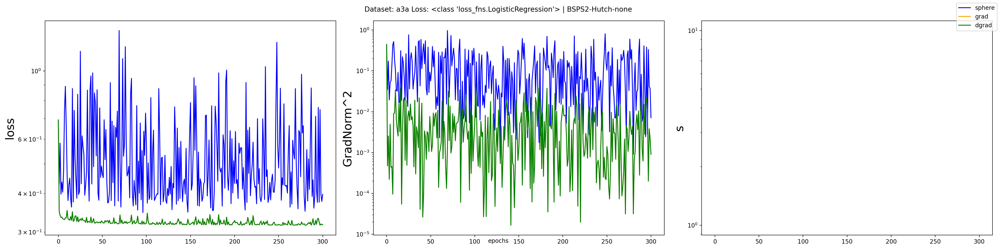

In [65]:
plot_results(results, "BSPS2-Hutch-none")

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 6))


ax1.semilogy([x[0] for x in hist_spsb_d])
ax1.semilogy([x[0] for x in hist_spsb_l1])
ax1.semilogy([x[0] for x in hist_spsb_l2])
ax1.semilogy([x[0] for x in hist_sgd])
ax1.semilogy([x[0] for x in hist_adam])


ax2.semilogy([x[1] for x in hist_spsb_d])
ax2.semilogy([x[1] for x in hist_spsb_l1])
ax2.semilogy([x[1] for x in hist_spsb_l2])
ax2.semilogy([x[1] for x in hist_sgd])
ax2.semilogy([x[1] for x in hist_adam])


ax3.semilogy([0 for x in hist_spsb_d])
ax3.semilogy([x[2] for x in hist_spsb_l1])
ax3.semilogy([x[2] for x in hist_spsb_l2])
ax3.semilogy([0 for x in hist_sgd])
ax3.semilogy([0 for x in hist_adam])


ax1.set_ylabel('loss', fontsize=20)
ax2.set_ylabel('GradNorm^2', fontsize=20)
ax3.set_ylabel('s', fontsize=20)

fig.text(0.5, 0.04, 'epochs', ha='center', va='center', )
fig.suptitle(f"Dataset: {dataset_name} Loss: {loss_class} | B is not equal to D")
fig.legend(['pspsb', 'pspsb2 L1', 'pspsb2 L2', 'sgd', 'adam'])
plt.tight_layout()
fig.show()

fig.savefig(f"../plots/pspsb2_{dataset_name}_logreg_scale:{scale_range}.png")